# Retinal AV Segmentation: Multiclass (Artery / Vein / Background)

This notebook trains a **MorphoBiFPNUNet** for **3-class segmentation** on fundus images.
A learnable **MorphoLayer** (parallel dilation + erosion) preprocesses the LIOT features
before they enter the BiFPN encoder, helping the network enhance vessel-like structures.

| Class | Label colour | Index |
|-------|--------------|-------|
| Background  | Black  | 0 |
| Artery      | Red    | 1 |
| Vein        | Blue   | 2 |

**Dataset layout** (each split folder):
```
Fundus-AVSeg-prep-data/
  images/        *.png          (fundus images)
  annotation/    *.png          (RGB multiclass label maps)
  npy/           *_liot_eg.npy  (LIOT feature arrays)
```

> **Note:** Crossing and Uncertainty pixels in the original annotations are
> remapped to Background (class 0) during loading.


## Imports

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import random
import itertools
import pandas as pd
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision
import torchvision.transforms as T

import math
import cv2
from pathlib import Path

import skimage
from skimage.measure import label, regionprops
from skimage import morphology
import torchvision.models as models
from scipy.spatial.distance import pdist, squareform
from codecarbon import EmissionsTracker
import copy, os, time
import matplotlib.gridspec as gridspec

from collections import Counter


print("All imports successful.")

All imports successful.


## Multiclass Constants

In [17]:
NUM_CLASSES   = 3
CLASS_NAMES   = {0: 'Background', 1: 'Artery', 2: 'Vein'}
CLASS_COLORS  = {
    0: np.array([  0,   0,   0], dtype=np.uint8),  # Background : black
    1: np.array([255,   0,   0], dtype=np.uint8),  # Artery     : red
    2: np.array([  0,   0, 255], dtype=np.uint8),  # Vein       : blue
}
VESSEL_CLASSES = [1, 2]   # classes used for mean Dice (exclude background)

print(f"Multiclass segmentation: {NUM_CLASSES} classes")
for k, v in CLASS_NAMES.items():
    print(f"  {k} = {v}")


Multiclass segmentation: 3 classes
  0 = Background
  1 = Artery
  2 = Vein


## Dataset Class

Loads PNG fundus images, LIOT `.npy` feature arrays, and converts RGB annotation maps to integer class masks.

In [18]:
class ImageDataset(data.Dataset):
    """
    Multiclass retinal AV segmentation dataset.

    Expected layout per split root:
        <root>/
            images/       *.png           (fundus images, RGB)
            annotation/   *.png           (RGB multiclass label maps)
            npy/          *_liot_eg.npy   (LIOT feature arrays, shape C×H×W)

    Label colour → class index:
        black  (0,0,0)       → 0  background
        red    (255,0,0)     → 1  artery
        blue   (0,0,255)     → 2  vein
        green  (0,255,0)     → 3  crossing
        white  (255,255,255) → 4  uncertainty
    """

    def __init__(self, root, new_size=592, supervised=True):
        self.root       = Path(root)
        self.supervised = supervised
        self.new_size   = new_size
        self.imagesize  = None

        img_dir = self.root / 'images'
        npy_dir = self.root / 'npy'
        ann_dir = self.root / 'annotation'

        # Discover images; derive matching LIOT and annotation paths by stem
        self.image_paths         = sorted(img_dir.glob('*.png'))
        self.image_liot_eg_paths = []
        self.label_paths         = []

        for img_path in self.image_paths:
            stem = img_path.stem                                    # e.g. '001_G'
            self.image_liot_eg_paths.append(npy_dir / f'{stem}_liot_eg.npy')
            if self.supervised:
                self.label_paths.append(ann_dir / f'{stem}.png')

        # ── Debug info ────────────────────────────────────────────────────────
        print(f"Dataset root        : {root}")
        print(f"  Images found      : {len(self.image_paths)}")
        print(f"  LIOT files found  : {len(self.image_liot_eg_paths)}")
        if self.supervised:
            print(f"  Annotations found : {len(self.label_paths)}")
        if self.image_paths:
            print(f"  First 5 images    : {[p.name for p in self.image_paths[:5]]}")

    # ── Padding helpers ───────────────────────────────────────────────────────

    def borders(self, original_size):
        """Return (left, top, right, bottom) padding to reach self.new_size."""
        H, W    = original_size
        delta_h = max(self.new_size - H, 0)
        delta_w = max(self.new_size - W, 0)
        top     = delta_h // 2
        bottom  = delta_h - top
        left    = delta_w // 2
        right   = delta_w - left
        return left, top, right, bottom

    # ── RGB annotation → integer class mask ───────────────────────────────────

    @staticmethod
    def rgb_to_class_mask(rgb_array):
        """
        Convert an RGB annotation array (H, W, 3) to an integer class mask (H, W).

        Colour thresholds are intentionally relaxed to handle minor JPEG/PNG
        compression artefacts while remaining mutually exclusive.

        Crossing (green) and Uncertainty (white) pixels are remapped to
        Background (0) — only 3 classes are used.

        Returns
        -------
        mask : np.ndarray, dtype int64, shape (H, W)
            Pixel-wise class indices: 0=Background, 1=Artery, 2=Vein.
        """
        r, g, b = rgb_array[:, :, 0], rgb_array[:, :, 1], rgb_array[:, :, 2]
        mask = np.zeros(rgb_array.shape[:2], dtype=np.int64)

        # Artery  – red-dominant
        mask[(r > 180) & (g < 80)  & (b < 80)]  = 1
        # Vein    – blue-dominant
        mask[(r < 80)  & (g < 80)  & (b > 180)] = 2
        # Crossing (green) and Uncertainty (white) → Background (0) — already 0

        return mask

    # ── Dataset protocol ──────────────────────────────────────────────────────

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        # ── Fundus image ──────────────────────────────────────────────────────
        image = Image.open(self.image_paths[index]).convert('RGB')
        
        # --- [Suggested Change] Add resizing here ---
        image = T.Resize((512, 512))(image)
        
        self.imagesize       = np.array(image).shape[:2]    # (H, W)
        left, top, right, bottom = self.borders(self.imagesize)
        pad = (left, top, right, bottom)

        img_tf = T.Compose([T.ToTensor(), T.Pad(pad)])
        image  = img_tf(image)                              # (3, H', W')

        # ── LIOT features ─────────────────────────────────────────────────────
        liot = np.load(self.image_liot_eg_paths[index])     # (C, H, W)
        
        # Note: If you resize the image, you must resize 'liot' and 'mask' 
        # to match these new dimensions before applying the padding 'img_tf'.
        
        liot = img_tf(liot.transpose(1, 2, 0))              # (C, H', W')

        # ── Annotation → integer class mask (LongTensor) ─────────────────────
        if self.supervised:
            ann_rgb = np.array(
                Image.open(self.label_paths[index]).convert('RGB')
            )                                               # (H, W, 3)
            mask = self.rgb_to_class_mask(ann_rgb)          # (H, W) int64
            mask = np.pad(mask,
                          ((top, bottom), (left, right)),
                          mode='constant', constant_values=0)
            label = torch.from_numpy(mask)                  # LongTensor (H', W')
            return image, liot, label

        return image, liot

## Load Data

Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/test
  Images found      : 20
  LIOT files found  : 20
  Annotations found : 20
  First 5 images    : ['081_D.png', '082_N.png', '083_G.png', '084_D.png', '085_N.png']
Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/train
  Images found      : 70
  LIOT files found  : 70
  Annotations found : 70
  First 5 images    : ['001_G.png', '002_N.png', '003_N.png', '004_D.png', '005_N.png']
Dataset sizes: {'train supervised': 70, 'test': 20}
Image shape     : torch.Size([1, 3, 1024, 1024])
LIOT shape      : torch.Size([1, 10, 1280, 1280])
Label shape     : torch.Size([1, 1280, 1280])   dtype: torch.int64
Unique classes  : [0, 1, 2]


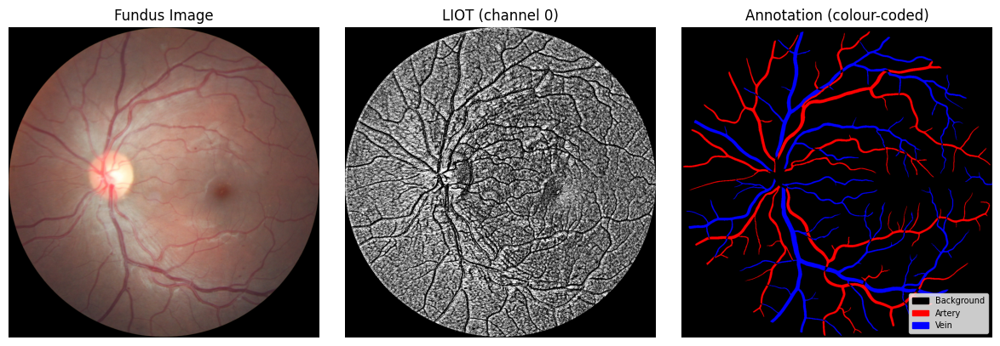

In [19]:
# ── Paths ─────────────────────────────────────────────────────────────────────
# Each split folder must contain images/, annotation/, and npy/ subfolders.
root = r"/home/mefeki/Bureau/work/Fundus-AVSeg-prep-data"

test_dataset              = ImageDataset(root=os.path.join(root, 'test'))
train_dataset_supervised  = ImageDataset(root=os.path.join(root, 'train'))

train_dataloader_supervised = data.DataLoader(
    train_dataset_supervised, shuffle=True, batch_size=2)
test_dataloader = data.DataLoader(test_dataset, shuffle=False, batch_size=1)

dataloaders   = {'train supervised': train_dataloader_supervised,
                 'test':             test_dataloader}
dataset_sizes = {'train supervised': len(train_dataset_supervised),
                 'test':             len(test_dataset)}
batch_sizes   = {'train supervised': 2, 'test': 1}

print("Dataset sizes:", dataset_sizes)

# ── Quick sanity-check visualisation ──────────────────────────────────────────
it = iter(dataloaders['test'])
inputs, inputs_LIOT_eg, labels = next(it)

print("Image shape     :", inputs.shape)
print("LIOT shape      :", inputs_LIOT_eg.shape)
print("Label shape     :", labels.shape, "  dtype:", labels.dtype)
print("Unique classes  :", labels.unique().tolist())

original_size = T.CenterCrop(test_dataset.imagesize)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# RGB image
out_inputs = torchvision.utils.make_grid(inputs)
axes[0].imshow(out_inputs.permute(1, 2, 0).clamp(0, 1))
axes[0].set_title('Fundus Image')
axes[0].axis('off')

# LIOT (first channel)
axes[1].imshow(inputs_LIOT_eg[0, 0].numpy(), cmap='gray')
axes[1].set_title('LIOT (channel 0)')
axes[1].axis('off')

# Colour-coded ground-truth label
lbl_np  = labels[0].numpy()                             # (H', W')
lbl_rgb = np.zeros((*lbl_np.shape, 3), dtype=np.uint8)
for cls_idx, color in CLASS_COLORS.items():
    lbl_rgb[lbl_np == cls_idx] = color
axes[2].imshow(lbl_rgb)
axes[2].set_title('Annotation (colour-coded)')
axes[2].axis('off')

# Legend
from matplotlib.patches import Patch
legend_handles = [
    Patch(color=np.array(c)/255, label=n)
    for c, n in zip(CLASS_COLORS.values(), CLASS_NAMES.values())
]
axes[2].legend(handles=legend_handles, loc='lower right', fontsize=7)

fig.tight_layout()
plt.show()

## Colour-Map Utility

In [20]:
def class_to_rgb(mask_np):
    """
    Convert an integer class mask (H, W) to a colour-coded RGB image (H, W, 3).

    Parameters
    ----------
    mask_np : np.ndarray, shape (H, W), dtype int
        Pixel-wise class indices (0=Background, 1=Artery, 2=Vein).

    Returns
    -------
    rgb : np.ndarray, shape (H, W, 3), dtype uint8
    """
    rgb = np.zeros((*mask_np.shape, 3), dtype=np.uint8)
    for cls_idx, color in CLASS_COLORS.items():
        rgb[mask_np == cls_idx] = color
    return rgb

## Network Architecture

**MorphoBiFPNUNet** extends the pure BiFPN-UNet with a learnable **MorphoLayer**
inserted between the raw LIOT input and the convolutional encoder.

```
LIOT (10 ch)
    │
    ▼
MorphoLayer  ──  parallel dilation & erosion → project back to 10 ch
    │
    ▼
Encoder  →  BiFPN neck  →  Decoder  →  logits (3 ch)
```

The `MorphoLayer` computes:
* **Dilation**: `max_pool2d(x, k)` — expands bright (vessel) regions.
* **Erosion**: `-max_pool2d(-x, k)` — contracts, removing thin noise.

Both outputs are concatenated channel-wise and projected back to `in_ch` via a
learnable 1×1 conv-BN-ReLU, so the downstream encoder sees the same channel count
as before.


In [21]:
# ===========================================================================
# Shared building blocks
# ===========================================================================

class ConvBlock(nn.Module):
    """Two bias-free 3×3 conv-BN-ReLU layers."""
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.conv(x)


class Encoder(nn.Module):
    """Standard convolutional encoder; returns one feature map per level."""
    def __init__(self, in_ch=10, base_ch=64, depth=4):
        super().__init__()
        chs = [base_ch * (2 ** i) for i in range(depth)]
        self.blocks = nn.ModuleList()
        self.pools  = nn.ModuleList()
        in_c = in_ch
        for c in chs:
            self.blocks.append(ConvBlock(in_c, c))
            self.pools.append(nn.MaxPool2d(2))
            in_c = c
        self.out_channels = chs

    def forward(self, x):
        feats = []
        for block, pool in zip(self.blocks, self.pools):
            x = block(x)
            feats.append(x)
            x = pool(x)
        return feats


class UpBlock(nn.Module):
    """Transpose-conv upsampling + skip concatenation + ConvBlock."""
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.ConvTranspose2d(in_ch, out_ch, 2, stride=2)
        self.conv = ConvBlock(out_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(x, size=skip.shape[-2:],
                              mode='bilinear', align_corners=False)
        return self.conv(torch.cat([skip, x], dim=1))


# ===========================================================================
# BiFPN neck
# ===========================================================================

class BiFPN(nn.Module):
    """
    Bidirectional Feature Pyramid Network with learned fast-normalised fusion.
    """
    def __init__(self, channels, num_layers=2, eps=1e-4):
        super().__init__()
        self.eps        = eps
        self.num_levels = len(channels)
        self.num_layers = num_layers

        self.convs_td = nn.ModuleList([ConvBlock(c, c) for c in channels])
        self.convs_bu = nn.ModuleList([ConvBlock(c, c) for c in channels])

        self.w_td = nn.Parameter(torch.ones(num_layers, self.num_levels, 2))
        self.w_bu = nn.Parameter(torch.ones(num_layers, self.num_levels, 3))

    def forward(self, feats):
        P = feats
        for l in range(self.num_layers):
            td = [None] * self.num_levels
            td[-1] = P[-1]
            for i in reversed(range(self.num_levels - 1)):
                w  = F.relu(self.w_td[l, i])
                w  = w / (w.sum() + self.eps)
                up = F.interpolate(td[i + 1], size=P[i].shape[-2:],
                                   mode='bilinear', align_corners=False)
                td[i] = self.convs_td[i](w[0] * P[i] + w[1] * up)

            bu = [None] * self.num_levels
            bu[0] = td[0]
            for i in range(1, self.num_levels):
                w    = F.relu(self.w_bu[l, i])
                w    = w / (w.sum() + self.eps)
                down = F.max_pool2d(bu[i - 1], 2)
                if down.shape[-2:] != td[i].shape[-2:]:
                    down = F.interpolate(down, size=td[i].shape[-2:],
                                         mode='bilinear', align_corners=False)
                bu[i] = self.convs_bu[i](
                    w[0] * P[i] + w[1] * td[i] + w[2] * down)
            P = bu
        return P


# ===========================================================================
# MorphoLayer  —  learnable morphological preprocessing
# ===========================================================================

class MorphoLayer(nn.Module):
    """
    Learnable morphological preprocessing layer.

    Applies parallel differentiable **dilation** and **erosion** to every
    input channel, concatenates the results channel-wise, and projects back
    to `out_ch` via a 1×1 conv-BN-ReLU block.

    Operations
    ----------
    * Dilation  : max_pool2d(x, kernel_size)
                  Brightens / expands high-intensity (vessel) regions.
    * Erosion   : −max_pool2d(−x, kernel_size)
                  Contracts, suppressing thin noise while preserving thick
                  vessel cores.

    The two outputs are concatenated along the channel dimension (giving
    2 × in_ch channels) and projected back to `out_ch` so the downstream
    encoder sees the same channel width as before.

    Parameters
    ----------
    in_ch       : int   Number of input channels (= LIOT channels, 10).
    out_ch      : int   Number of output channels (typically = in_ch).
    kernel_size : int   Structuring-element footprint size (default 7).
    """
    def __init__(self, in_ch: int, out_ch: int, kernel_size: int = 7):
        super().__init__()
        self.kernel_size = kernel_size
        self.padding     = kernel_size // 2

        # 1×1 projection: [dilation ‖ erosion] (2·in_ch) → out_ch
        self.proj = nn.Sequential(
            nn.Conv2d(in_ch * 2, out_ch, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Parameters
        ----------
        x : Tensor  (B, in_ch, H, W)

        Returns
        -------
        Tensor  (B, out_ch, H, W)
        """
        k, p = self.kernel_size, self.padding

        # Dilation: max over local neighbourhood
        dilated = F.max_pool2d(x, kernel_size=k, stride=1, padding=p)

        # Erosion: min over local neighbourhood = −max_pool(−x)
        eroded  = -F.max_pool2d(-x, kernel_size=k, stride=1, padding=p)

        # Concatenate and project
        return self.proj(torch.cat([dilated, eroded], dim=1))


# ===========================================================================
# MorphoBiFPNUNet  —  BiFPN-UNet with learnable morphological preprocessing
# ===========================================================================

class MorphoBiFPNUNet(nn.Module):
    """
    MorphoBiFPN-UNet for multiclass segmentation.

    Adds a learnable **MorphoLayer** before the convolutional encoder of
    the standard BiFPN-UNet.  The morphological stage enhances vessel-like
    tubular structures in the LIOT feature maps before multi-scale encoding.

    Pipeline
    --------
    LIOT (in_channels)
        │
        ▼
    MorphoLayer  ──  dilation + erosion → 1×1 proj → in_channels
        │
        ▼
    Encoder  ──►  BiFPN neck  ──►  Decoder  ──►  logits (num_classes)

    Args
    ----
    in_channels      : LIOT feature channels (default 10).
    num_classes      : number of segmentation classes (default NUM_CLASSES = 3).
    base_ch          : encoder base width; doubles each level (default 64).
    depth            : encoder / decoder depth (default 4).
    num_bifpn_layers : BiFPN bidirectional passes (default 2).
    bifpn_ch         : uniform channel width in the BiFPN neck (default 128).
    morpho_kernel    : structuring-element size in MorphoLayer (default 7).
    """
    def __init__(self, in_channels=10, num_classes=NUM_CLASSES,
                 base_ch=64, depth=4, num_bifpn_layers=2, bifpn_ch=128,
                 morpho_kernel=7):
        super().__init__()
        self.num_classes = num_classes

        # ── Morphological preprocessing ──────────────────────────────────────
        # Projects back to in_channels so the encoder is unchanged.
        self.morpho = MorphoLayer(in_channels, in_channels,
                                  kernel_size=morpho_kernel)

        # ── Encoder ──────────────────────────────────────────────────────────
        self.encoder = Encoder(in_ch=in_channels, base_ch=base_ch, depth=depth)

        # ── 1×1 projections: encoder channels → bifpn_ch ────────────────────
        self.proj = nn.ModuleList([
            nn.Conv2d(c, bifpn_ch, kernel_size=1)
            for c in self.encoder.out_channels
        ])

        # ── BiFPN neck ───────────────────────────────────────────────────────
        self.bifpn = BiFPN([bifpn_ch] * depth, num_layers=num_bifpn_layers)

        # ── Decoder ──────────────────────────────────────────────────────────
        self.center    = ConvBlock(bifpn_ch, bifpn_ch)
        self.up_blocks = nn.ModuleList([
            UpBlock(bifpn_ch, bifpn_ch, bifpn_ch) for _ in range(depth - 1)
        ])

        # ── Output head: num_classes logit maps (no activation) ──────────────
        self.final_conv = nn.Conv2d(bifpn_ch, num_classes, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # 1. Morphological feature enhancement
        x = self.morpho(x)                              # (B, in_ch, H, W)

        # 2. Encode
        enc_feats = self.encoder(x)

        # 3. Project to BiFPN width
        enc_feats = [proj(f) for proj, f in zip(self.proj, enc_feats)]

        # 4. BiFPN fusion
        fused = self.bifpn(enc_feats)

        # 5. Decode
        x = self.center(fused[-1])
        for i, up in enumerate(self.up_blocks):
            x = up(x, fused[-2 - i])

        return self.final_conv(x)         # (B, num_classes, H, W) – raw logits


## CLAHE Preprocessing

In [22]:
def clahe(inputs, clipLimit=4, tileGridSize=(8, 8)):
    """Apply CLAHE to the green channel; returns (B, 1, H, W) float tensor."""
    inputs      = inputs.to('cpu')
    clahe_obj   = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    green_ch    = np.uint8(255 * inputs[:, 1, :, :])
    res         = np.array([clahe_obj.apply(g) for g in green_ch], dtype=float) / 255
    return torch.tensor(res, dtype=torch.float).unsqueeze(1).to(device)

## Loss Function: WeightedCELoss

Standard weighted cross-entropy loss. Class weights are computed from pixel frequencies in the training subset and passed to `nn.CrossEntropyLoss`.


In [23]:
class WeightedCELoss(nn.Module):
    """
    Weighted Cross-Entropy loss for multiclass segmentation.

    Class weights are computed from pixel frequencies in the training subset
    to counteract class imbalance (background dominates in fundus images).

    Parameters
    ----------
    class_weights : Tensor or None
        Per-class weights passed to nn.CrossEntropyLoss.
        Shape: (num_classes,). If None, all classes are weighted equally.
    """
    def __init__(self, class_weights=None):
        super().__init__()
        self.criterion = nn.CrossEntropyLoss(weight=class_weights)

    def forward(self, outputs, labels):
        """
        outputs : Tensor (B, num_classes, H, W) – raw logits
        labels  : Tensor (B, H, W)             – integer class indices
        """
        return self.criterion(outputs, labels.long())


## Evaluation Metrics

All functions accept `(B, H, W)` LongTensor predictions and labels.

In [24]:
def accuracy(preds, labels, eps=1e-6):
    """Overall pixel accuracy."""
    preds  = original_size(preds)
    labels = original_size(labels)
    return float(torch.sum(preds == labels)) / (float(labels.numel()) + eps)


def dice_coef_per_class(preds, labels, num_classes=NUM_CLASSES, eps=1e-6):
    """
    Compute Dice coefficient for each class.

    Returns
    -------
    per_class : dict {class_idx: dice_value}
    mean_vessel_dice : float
        Mean Dice over VESSEL_CLASSES = [1 (artery), 2 (vein)].
    """
    preds  = original_size(preds)
    labels = original_size(labels)
    per_class = {}
    for c in range(num_classes):
        pred_c  = (preds  == c).float()
        label_c = (labels == c).float()
        tp = float(torch.sum(pred_c  * label_c))
        fp = float(torch.sum(pred_c  * (1 - label_c)))
        fn = float(torch.sum((1 - pred_c) * label_c))
        per_class[c] = 2 * tp / (2 * tp + fp + fn + eps)
    mean_vessel_dice = float(np.mean([per_class[c] for c in VESSEL_CLASSES]))
    return per_class, mean_vessel_dice


def sensitivity(preds, labels, cls=1, eps=1e-6):
    """Sensitivity (recall) for a given class."""
    preds  = original_size(preds)
    labels = original_size(labels)
    TP = float(torch.sum((preds == cls) & (labels == cls)))
    FN = float(torch.sum((preds != cls) & (labels == cls)))
    return TP / (TP + FN + eps)


def specificity(preds, labels, cls=1, eps=1e-6):
    """Specificity for a given class."""
    preds  = original_size(preds)
    labels = original_size(labels)
    TN = float(torch.sum((preds != cls) & (labels != cls)))
    FP = float(torch.sum((preds == cls) & (labels != cls)))
    return TN / (TN + FP + eps)


def precision(preds, labels, cls=1, eps=1e-6):
    """Precision for a given class."""
    preds  = original_size(preds)
    labels = original_size(labels)
    TP = float(torch.sum((preds == cls) & (labels == cls)))
    FP = float(torch.sum((preds == cls) & (labels != cls)))
    return TP / (TP + FP + eps)

## Post-processing: Remove Circular FOV Boundary

In [25]:
def remove_circle(inputs, preds, kernel_size, threshold):
    """
    Zero-out (set to background class 0) predictions that fall outside the
    circular field-of-view inferred from the fundus image brightness.

    Parameters
    ----------
    inputs : Tensor (B, C, H, W)   original RGB fundus image (float).
    preds  : Tensor (B, H, W)      integer class predictions (LongTensor).
    kernel_size : int              morphological line-erosion kernel size.
    threshold   : float            brightness threshold for FOV detection.

    Returns
    -------
    masked_preds : Tensor (B, H, W)  LongTensor, 0 outside FOV.
    """
    # Handle RGBA: composite on white background
    if inputs.shape[1] == 4:
        rgb   = inputs[:, :3, :, :]
        alpha = inputs[:, 3:, :, :]
        inputs_rgb = rgb * alpha + (1 - alpha)
    else:
        inputs_rgb = inputs

    RGB_to_GRAY = T.Grayscale()
    mask = (RGB_to_GRAY(inputs_rgb) > threshold).float()   # (B, 1, H, W)

    p1 = -F.max_pool2d(-mask, kernel_size=(kernel_size, 1), stride=(1, 1),
                       padding=(kernel_size // 2, 0))
    p2 = -F.max_pool2d(-mask, kernel_size=(1, kernel_size), stride=(1, 1),
                       padding=(0, kernel_size // 2))

    circle_mask = (torch.min(p1, p2) > 0).squeeze(1).long()  # (B, H, W)

    return preds * circle_mask   # 0 outside FOV → background

## Training & Test Functions


In [26]:
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs):
    """
    Train model on train_loader and validate on val_loader for num_epochs.
    Returns the trained model, train loss history, and val loss history.
    """
    model.train()
    train_losses = []
    val_losses   = []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        
        # --- Training Step ---
        model.train()
        batch_losses = []
        for inputs, inputs_LIOT_vp, labels in train_loader:
            inputs_LIOT_vp = inputs_LIOT_vp.to(device)
            labels         = labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs_LIOT_vp)
            loss    = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            batch_losses.append(loss.item())

        mean_train_loss = sum(batch_losses) / len(batch_losses)
        train_losses.append(mean_train_loss)

        # --- Validation Step ---
        model.eval()
        val_batch_losses = []
        with torch.no_grad():
            for inputs, inputs_LIOT_vp, labels in val_loader:
                inputs_LIOT_vp = inputs_LIOT_vp.to(device)
                labels         = labels.to(device)
                
                outputs = model(inputs_LIOT_vp)
                loss    = criterion(outputs, labels)
                val_batch_losses.append(loss.item())
        
        mean_val_loss = sum(val_batch_losses) / len(val_batch_losses)
        val_losses.append(mean_val_loss)
        
        print(f'Train Loss: {mean_train_loss:.4f} | Val Loss: {mean_val_loss:.4f}')

    print('Training complete.')
    return model, train_losses, val_losses


def original_size(tensor):
    return tensor


def dice_coef_per_class(preds, labels, num_classes=NUM_CLASSES, eps=1e-6):
    preds  = original_size(preds)
    labels = original_size(labels)
    per_class = {}
    for c in range(num_classes):
        pred_c  = (preds  == c).float()
        label_c = (labels == c).float()
        tp = float(torch.sum(pred_c  * label_c))
        fp = float(torch.sum(pred_c  * (1 - label_c)))
        fn = float(torch.sum((1 - pred_c) * label_c))
        per_class[c] = 2 * tp / (2 * tp + fp + fn + eps)
    mean_vessel_dice = float(np.mean([per_class[c] for c in VESSEL_CLASSES]))
    return per_class, mean_vessel_dice


def test_model(model, display_results=False):
    """
    Evaluate model on the test set.

    Returns
    -------
    mean_vessel_dice : float
        Mean Dice over artery and vein classes.
    """
    model.eval()
    total_dice = 0.0
    n = 0

    with torch.no_grad():
        for inputs, inputs_LIOT_vp, labels in dataloaders['test']:
            inputs         = inputs.to(device)
            inputs_LIOT_vp = inputs_LIOT_vp.to(device)
            labels         = labels.to(device)

            logits = model(inputs_LIOT_vp)
            probs  = torch.softmax(logits, dim=1)
            preds  = torch.argmax(probs, dim=1)
            preds  = remove_circle(inputs, preds, 7, 0.1)

            _, vessel_dice = dice_coef_per_class(preds, labels)
            total_dice += vessel_dice
            n += 1

            if display_results:
                pred_rgb  = class_to_rgb(preds[0].cpu().numpy())
                label_rgb = class_to_rgb(labels[0].cpu().numpy())

                fig, axes = plt.subplots(1, 3, figsize=(14, 5))
                axes[0].imshow(inputs[0].cpu().permute(1, 2, 0).clamp(0, 1))
                axes[0].set_title('Fundus Image')
                axes[0].axis('off')
                axes[1].imshow(label_rgb)
                axes[1].set_title('Ground Truth')
                axes[1].axis('off')
                axes[2].imshow(pred_rgb)
                axes[2].set_title(f'Prediction  (Dice={vessel_dice:.4f})')
                axes[2].axis('off')

                from matplotlib.patches import Patch
                legend = [Patch(color=np.array(c)/255, label=n)
                          for c, n in zip(CLASS_COLORS.values(), CLASS_NAMES.values())]
                axes[2].legend(handles=legend, loc='lower right', fontsize=7)
                fig.tight_layout()
                plt.show()

    final_dice = total_dice / max(n, 1)
    print(f'\nMean vessel Dice on test set: {final_dice:.4f}')
    print('For reference, models outperformed another model: Unet dice 0.739')
    return final_dice


In [27]:
def validate_model(model, dataloader, device):
    model.eval()
    total_dice = 0.0
    n = 0
    with torch.no_grad():
        for inputs, inputs_LIOT_vp, labels in dataloader:
            inputs, inputs_LIOT_vp, labels = inputs.to(device), inputs_LIOT_vp.to(device), labels.to(device)
            logits = model(inputs_LIOT_vp)
            preds = torch.argmax(torch.softmax(logits, dim=1), dim=1)
            
            # Use your existing dice_coef_per_class function
            _, vessel_dice = dice_coef_per_class(preds, labels)
            total_dice += vessel_dice
            n += 1
    return total_dice / max(n, 1)

## Fixed 8-Image Subset: indices [1, 3, 5, 6, 7, 12, 15, 16]

The training subset is fixed to the 8 images at indices `[1, 3, 5, 6, 7, 12, 15, 16]`. The model will be trained directly on this subset for **150 epochs**.

In [28]:
import torch
import gc

gc.collect()
torch.cuda.empty_cache()

In [29]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

# ── Load full training dataset ────────────────────────────────────────────────
train_root         = os.path.join(root, 'train')
train_dataset_full = ImageDataset(root=train_root, supervised=True)

# ── Fixed subset indices ──────────────────────────────────────────────────────
FIXED_INDICES = [1, 3, 5, 6]
best_subset   = tuple(FIXED_INDICES)

print(f"Total training images available : {len(train_dataset_full)}")
print(f"Selected subset indices         : {FIXED_INDICES}")
print(f"Subset size                     : {len(FIXED_INDICES)}")

assert all(i < len(train_dataset_full) for i in FIXED_INDICES), \
    f"One or more indices out of range (max={len(train_dataset_full)-1})"
print('All indices valid. ✓')

Using device: cuda:0
Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/train
  Images found      : 70
  LIOT files found  : 70
  Annotations found : 70
  First 5 images    : ['001_G.png', '002_N.png', '003_N.png', '004_D.png', '005_N.png']
Total training images available : 70
Selected subset indices         : [1, 3, 5, 6]
Subset size                     : 4
All indices valid. ✓


## class weights

## Training on the Fixed Subset (150 epochs)

A fresh **MorphoBiFPNUNet** (multiclass, 3 outputs) is trained from scratch on the
selected images for **150 epochs** using **WeightedCELoss**.
The MorphoLayer is trained end-to-end together with the rest of the network.


In [30]:
# ── Training hyper-parameters ─────────────────────────────────────────────────
EPOCHS     = 150
BATCH_SIZE = 1
SEED       = 42

# 1. Setup DataLoaders (using full training set)
train_dataloader = data.DataLoader(train_dataset_full, shuffle=True, batch_size=BATCH_SIZE)
print(f'\n=== Training on full dataset: {len(train_dataset_full)} images ===')

# Setup validation set
val_root = os.path.join(root, 'val') 
val_dataset = ImageDataset(root=val_root, supervised=True)
val_dataloader = data.DataLoader(val_dataset, shuffle=False, batch_size=BATCH_SIZE)

torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# ── Class weights ─────────────────────────────────────────────────────────────
pixel_counts = Counter()
for _, _, lbl in train_dataset_full:
    for c in range(NUM_CLASSES):
        pixel_counts[c] += int((lbl == c).sum())

total    = sum(pixel_counts.values())
freqs    = torch.tensor([pixel_counts[c] / total for c in range(NUM_CLASSES)])
inv_freq = 1.0 / (freqs + 1e-6)
class_weights = inv_freq / inv_freq[1:].mean()
class_weights = class_weights.to(device)

# ── Delete any stale model from a previous run ──────────────────────────────
try:
    del model
except NameError:
    pass

# ── Free any leftover GPU memory ────────────────────────────────────────────
import gc
gc.collect()
torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

# ── Model, loss, optimiser ────────────────────────────────────────────────────

# Initialize model
model = MorphoBiFPNUNet(in_channels=10, num_classes=NUM_CLASSES,
                base_ch=16, depth=4, num_bifpn_layers=1,
                bifpn_ch=32, morpho_kernel=7)

device = torch.device('cuda:0')
model = model.to(device)

# ── Parameter count ─────────────────────────────────────────────────────────
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total parameters     : {total_params:,}')
print(f'Trainable parameters : {trainable_params:,}')
criterion = WeightedCELoss(class_weights=class_weights)
optimizer = optim.Adam(model.parameters(), lr=1e-3, betas=(0.9, 0.999), eps=1e-07)

# 2. Update to use 'train_dataloader' and 'val_dataloader'
# Note: Ensure your 'train_model' function definition is updated 
# to accept 'val_dataloader' and perform evaluation during epochs.
model, training_losses, val_losses = train_model(
    model, criterion, optimizer, train_dataloader, val_dataloader, num_epochs=EPOCHS
)

# ── Save ──────────────────────────────────────────────────────────────────────
os.makedirs('models', exist_ok=True)
save_path = 'models/best_model_morpho_bifpn_wce.pth'
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")

# ── Plot diagnostics ──────────────────────────────────────────────────────────
plt.figure(figsize=(8, 6))
plt.plot(range(1, EPOCHS+1), training_losses, label='Train Loss')
plt.plot(range(1, EPOCHS+1), val_losses, label='Val Loss') # Added validation loss
plt.xlabel('Epoch')
plt.ylabel('Weighted Cross-Entropy Loss')
plt.title(f'MorphoBiFPN-UNet Training')
plt.legend()
plt.grid(True)
plt.show()


=== Training on full dataset: 70 images ===
Dataset root        : /home/mefeki/Bureau/work/Fundus-AVSeg-prep-data/val
  Images found      : 10
  LIOT files found  : 10
  Annotations found : 10
  First 5 images    : ['071_N.png', '072_N.png', '073_D.png', '074_N.png', '075_D.png']
Epoch 1/150


OutOfMemoryError: CUDA out of memory. Tried to allocate 400.00 MiB. GPU 0 has a total capacity of 47.26 GiB of which 59.56 MiB is free. Including non-PyTorch memory, this process has 46.82 GiB memory in use. Of the allocated memory 44.04 GiB is allocated by PyTorch, and 2.60 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://docs.pytorch.org/docs/stable/notes/cuda.html#optimizing-memory-usage-with-pytorch-cuda-alloc-conf)

## (Optional) Visualise Best Model Predictions

Class               Dice
-------------------------
  Background      0.9749
  Artery          0.4205
  Vein            0.5292

  Mean vessel Dice (artery + vein): 0.4749


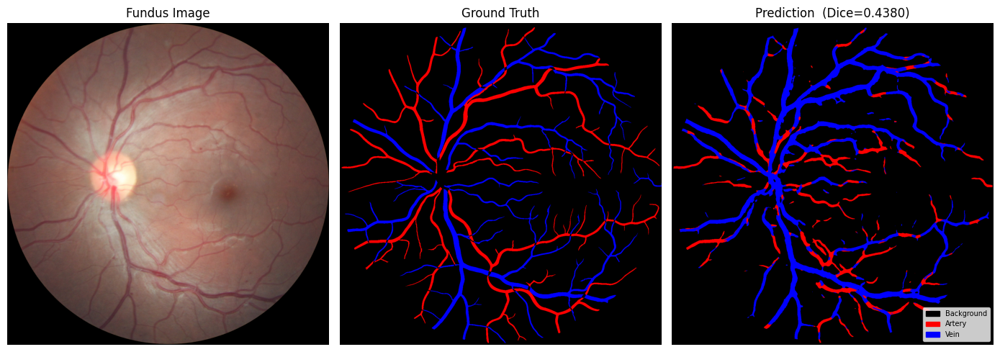

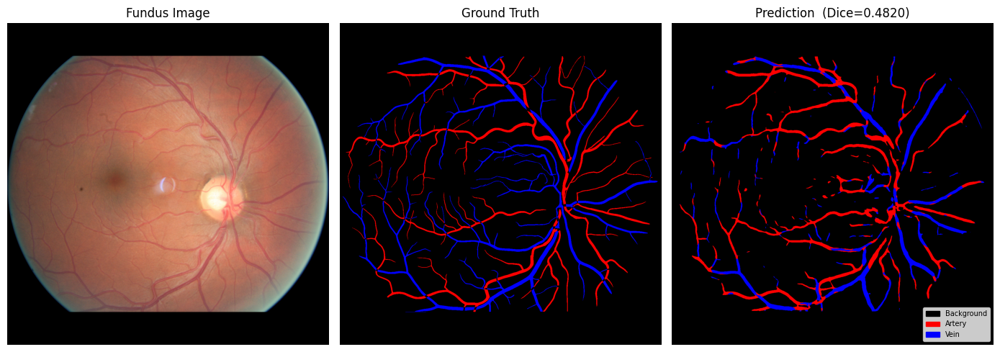

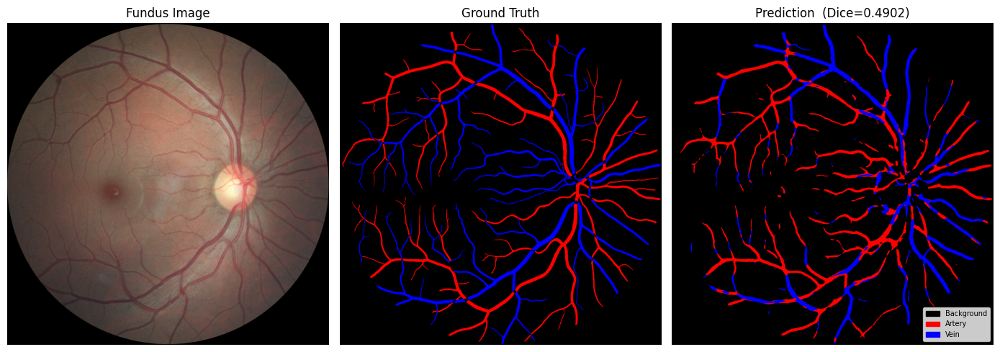

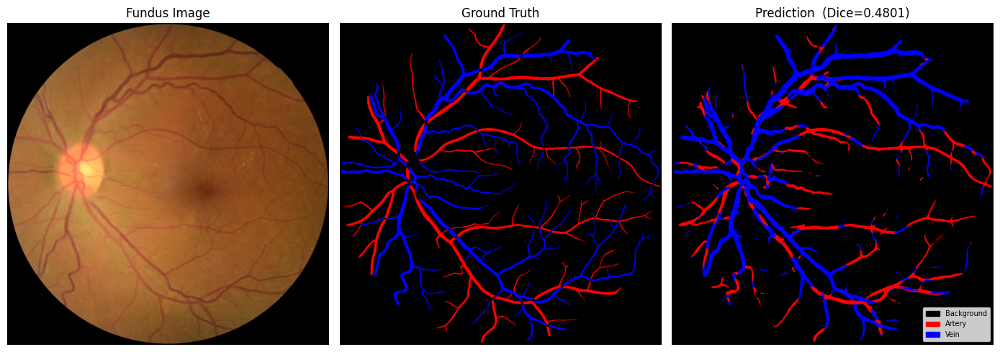

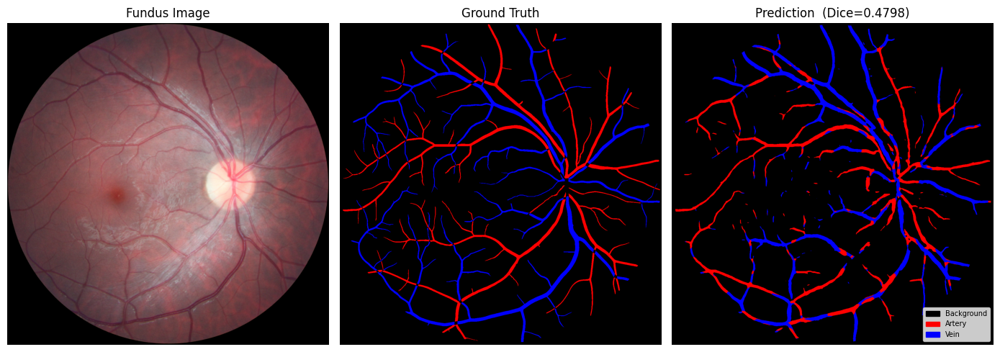

...

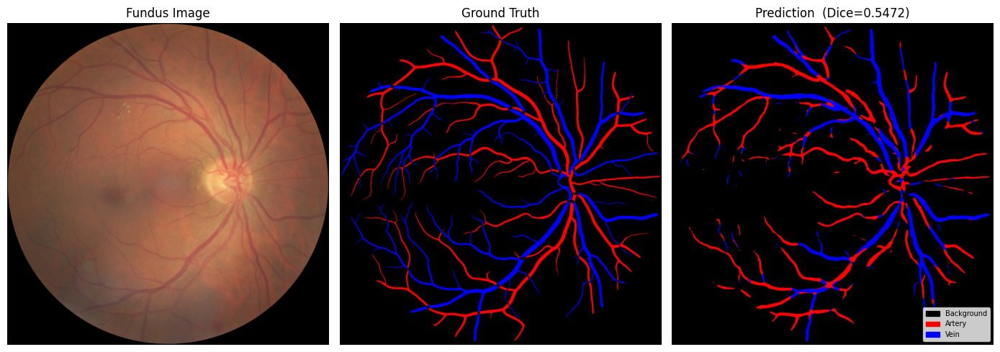

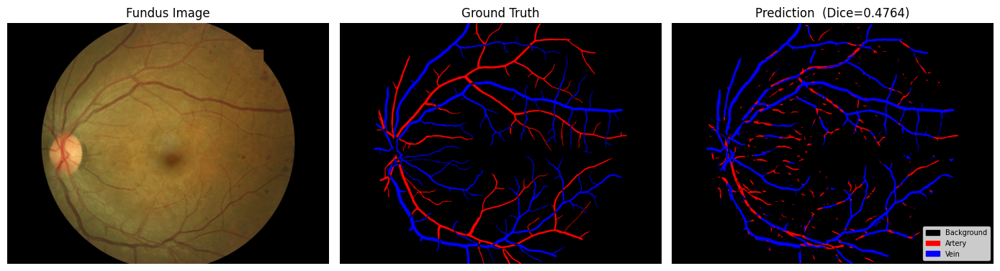

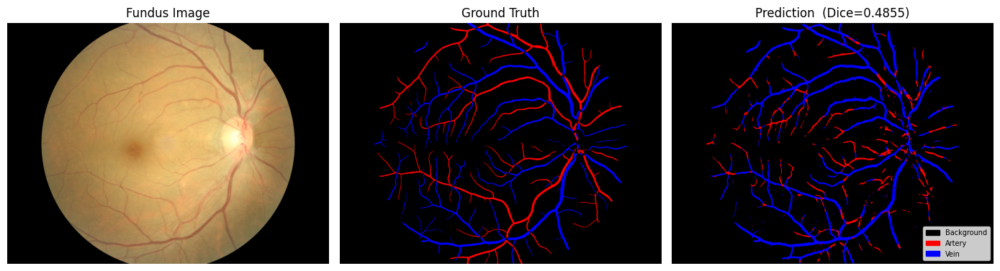

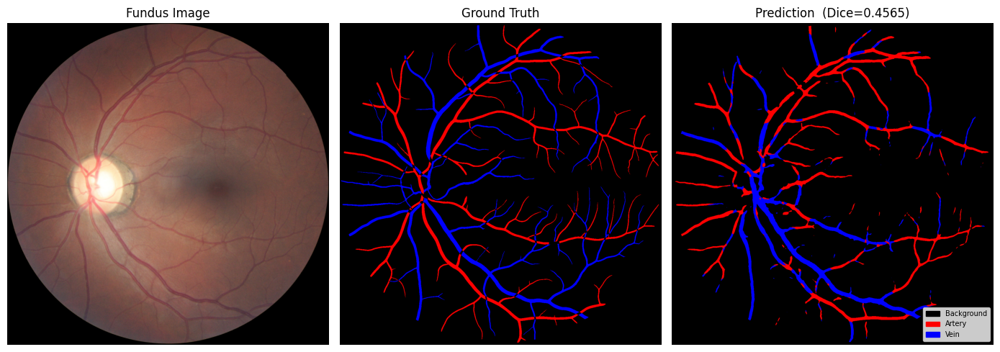

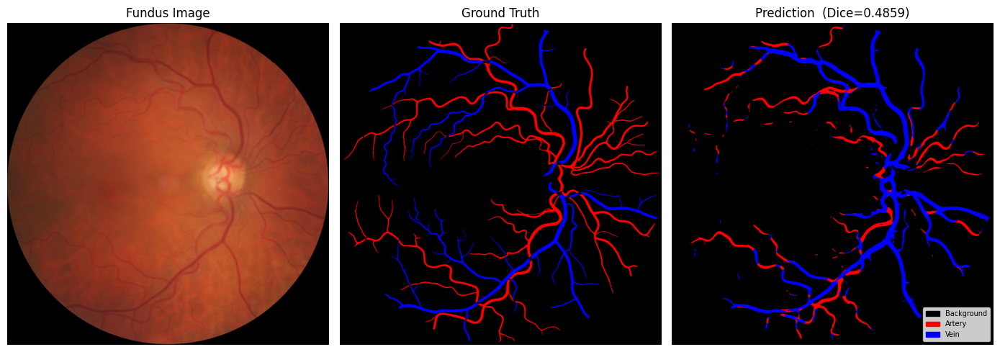


Mean vessel Dice on test set: 0.4749
For reference, models outperformed another model: Unet dice 0.739


0.4748644261334013

In [ ]:
model.eval()
with torch.no_grad():
    print(f"{'Class':<15} {'Dice':>8}")
    print('-' * 25)

    all_class_dice = {c: [] for c in range(NUM_CLASSES)}

    for inputs, inputs_LIOT_vp, labels in dataloaders['test']:
        inputs         = inputs.to(device)
        inputs_LIOT_vp = inputs_LIOT_vp.to(device)
        labels         = labels.to(device)

        logits = model(inputs_LIOT_vp)
        preds  = torch.argmax(torch.softmax(logits, dim=1), dim=1)
        preds  = remove_circle(inputs, preds, 7, 0.1)

        per_class, _ = dice_coef_per_class(preds, labels)
        for c, d in per_class.items():
            all_class_dice[c].append(d)

    for c in range(NUM_CLASSES):
        mean_d = np.mean(all_class_dice[c])
        print(f"  {CLASS_NAMES[c]:<13} {mean_d:>8.4f}")

    mean_vessel = np.mean([np.mean(all_class_dice[c]) for c in VESSEL_CLASSES])
    print(f"\n  Mean vessel Dice (artery + vein): {mean_vessel:.4f}")

# ── Visual comparison ─────────────────────────────────────────────────────────
test_model(model, display_results=True)
